In [0]:
import os
os.chdir('/content')
!wget http://vllab.ucmerced.edu/wlai24/LapSRN/results/SR_training_datasets.zip
!wget http://vllab.ucmerced.edu/wlai24/LapSRN/results/SR_testing_datasets.zip

In [0]:
#!unzip SR_training_datasets
!unzip SR_testing_datasets

In [0]:
SR_FACTOR = 2

In [0]:
import torch
import torch.utils.data as tud
import torch.nn.functional as F
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms, datasets

torch.cuda.empty_cache()

In [0]:
import random
import numpy as np

SEED = 1234

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.backends.cudnn.deterministic = True

In [0]:
import os
from PIL import Image, ImageFilter

class SRDataSet(tud.Dataset):
    def update_transform(transform):
        self.before_T = transform[0]
        self.after_T = transform[1]
        
    def __init__(self, root_dir, sr_factor=2, transform=None):
        self.root_dir = root_dir
        self.before_T = transform[0]
        self.after_T = transform[1]

        self.files = os.listdir(self.root_dir)
        self.files.sort()
        self.length = len(self.files)
        self.sr_factor = sr_factor

    def __len__(self):
        return self.length
    
    def __getitem__(self, idx):
        f = os.path.join(self.root_dir, self.files[idx])
        #img = cv2.imread(f)
        #img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
        img = Image.open(f)

        if self.before_T:
            img = self.before_T(img)

        # Create LR image
        sr_factor = self.sr_factor
        width, height = img.size

        # Add gaussian blur
        blur_img = img.filter(ImageFilter.GaussianBlur(radius = 1))
        lr_img = blur_img.resize(size=(width // sr_factor, height // sr_factor),
                            resample=Image.BICUBIC)
        lr_img = lr_img.resize(size=(width, height), resample=Image.BICUBIC)

        if self.after_T:
            img = self.after_T(img)
            lr_img = self.after_T(lr_img)

        sample = {'og': img, 'lr': lr_img}
        return sample

In [0]:
before_transform = transforms \
                    .Compose([
                              transforms.RandomRotation(10),
                              transforms.RandomCrop(128, padding = 5),
                    ])

after_transform = transforms \
                    .Compose([
                              transforms.ToTensor(),
                    ])

test_before_T = transforms \
                    .Compose([
                    ])

test_after_T = transforms \
                    .Compose([
                              transforms.ToTensor(),
                    ])

train_data = SRDataSet(root_dir='./BSDS200', sr_factor=SR_FACTOR,
                    transform = (before_transform, after_transform))

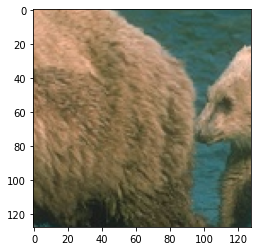

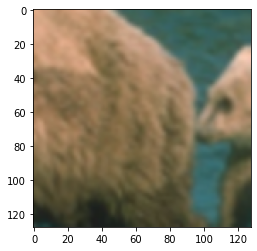

In [55]:
import matplotlib.pyplot as plt
data = train_data[0]
plt.figure()
plt.imshow(data['og'].permute(1, 2, 0))
plt.figure()
plt.imshow(data['lr'].permute(1, 2, 0))

In [56]:
split_ratio = 0.8
num_train = int(len(train_data) * split_ratio)
num_val = int(len(train_data) - num_train)
train_data, valid_data = tud.random_split(train_data, 
                                           [num_train, num_val])

import copy
valid_data = copy.deepcopy(valid_data)
valid_data.dataset.transform = (test_before_T, test_after_T)
print(valid_data.dataset.transform)

(Compose(
), Compose(
    ToTensor()
))


In [0]:
batch_size = 40
train_iter = tud.DataLoader(train_data, shuffle=True, batch_size=batch_size)
valid_iter = tud.DataLoader(valid_data, shuffle=True, batch_size=batch_size)

In [58]:
len(train_iter), len(train_data), len(valid_iter), len(valid_data)

(4, 160, 1, 40)

# Model

In [0]:
class SRCNN(nn.Module):
    def __init__(self):
        super().__init__()

        self.conv1 = nn.Conv2d(3, 128, (9, 9), padding=4)
        self.conv2 = nn.Conv2d(128, 64, (3, 3), padding=1)
        self.conv3 = nn.Conv2d(64, 3, (5, 5), padding=2)
    
    def forward(self, inputs):
        lr_slope = 0.01
        x = self.conv1(inputs)
        x = F.leaky_relu(x, negative_slope = lr_slope)

        x = self.conv2(x)
        x = F.leaky_relu(x, lr_slope)

        x = self.conv3(x)

        return x

In [0]:
def psnr(y_pred, y_orig):
    return 10 * torch.log10(1 / F.mse_loss(y_pred, y_orig))

# Train functions

In [0]:
def train(model, iterator, optimizer, criterion, device):
    epoch_loss = 0
    epoch_psnr = 0

    model.train()
    for batch in iterator:
        y_orig, lr = batch['og'], batch['lr']
        y_orig = y_orig.to(device)
        lr = lr.to(device)

        optimizer.zero_grad()

        # Forward
        y_pred = model(lr)
        loss = criterion(y_pred, y_orig)
        psnr_ = psnr(y_pred, y_orig)

        loss.backward()
        optimizer.step()

        epoch_loss += loss
        epoch_psnr += psnr_
    
    return epoch_loss / len(iterator), epoch_psnr / len(iterator)

In [0]:
def evaluate(model, iterator, criterion, device):
    epoch_loss = 0
    epoch_psnr = 0

    model.eval()
    with torch.no_grad():
        for batch in iterator:
            y_orig, lr = batch['og'], batch['lr']
            y_orig = y_orig.to(device)
            lr = lr.to(device)

            # Forward
            y_pred = model(lr)
            loss = criterion(y_pred, y_orig)
            psnr_ = psnr(y_pred, y_orig)
    
            epoch_loss += loss
            epoch_psnr += psnr_
    
    return epoch_loss / len(iterator), epoch_psnr / len(iterator)

In [0]:
def epoch_time(start_time, end_time):
    elapsed_time = end_time - start_time
    elapsed_mins = int(elapsed_time / 60)
    elapsed_secs = int(elapsed_time - (elapsed_mins * 60))
    return elapsed_mins, elapsed_secs

# Train Model

In [0]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = SRCNN().to(device)
optimizer = optim.Adam(model.parameters())
criterion = nn.MSELoss().to(device)

In [73]:
model

SRCNN(
  (conv1): Conv2d(3, 128, kernel_size=(9, 9), stride=(1, 1), padding=(4, 4))
  (conv2): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(64, 3, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
)

In [74]:
import time

epochs = 100
print_every = 10
best_valid_loss = float('inf')
history = {'loss': [], 'psnr': [], 'valid_loss': [], 'valid_psnr': []}

for epoch in range(epochs):
    st = time.time()

    train_loss, train_psnr = train(model, train_iter, optimizer, criterion, device)
    valid_loss, valid_psnr = evaluate(model, valid_iter, criterion, device)

    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        torch.save(model.state_dict(), 'srcnn.pt')

    et = time.time()

    epoch_mins, epoch_secs = epoch_time(st, et)

    if (epoch + 1) % print_every == 0:
        print(f'Epoch: {epoch+1:02} | Epoch Time: {epoch_mins}m {epoch_secs}s')
        print(f'\tTrain Loss: {train_loss*100:.3f} | Train PSNR: {train_psnr:.2f}')
        print(f'\t Val. Loss: {valid_loss*100:.3f} |  Val. Psnr: {valid_psnr:.2f}')
    
    history['loss'].append(train_loss)
    history['valid_loss'].append(valid_loss)
    history['psnr'].append(train_psnr)
    history['valid_psnr'].append(valid_psnr)

Epoch: 10 | Epoch Time: 0m 1s
	Train Loss: 0.769 | Train PSNR: 21.16
	 Val. Loss: 0.737 |  Val. Psnr: 21.33
Epoch: 20 | Epoch Time: 0m 1s
	Train Loss: 0.467 | Train PSNR: 23.31
	 Val. Loss: 0.401 |  Val. Psnr: 23.97
Epoch: 30 | Epoch Time: 0m 1s
	Train Loss: 0.368 | Train PSNR: 24.38
	 Val. Loss: 0.342 |  Val. Psnr: 24.66
Epoch: 40 | Epoch Time: 0m 1s
	Train Loss: 0.310 | Train PSNR: 25.08
	 Val. Loss: 0.283 |  Val. Psnr: 25.48
Epoch: 50 | Epoch Time: 0m 1s
	Train Loss: 0.264 | Train PSNR: 25.83
	 Val. Loss: 0.279 |  Val. Psnr: 25.55
Epoch: 60 | Epoch Time: 0m 1s
	Train Loss: 0.271 | Train PSNR: 25.71
	 Val. Loss: 0.219 |  Val. Psnr: 26.60
Epoch: 70 | Epoch Time: 0m 1s
	Train Loss: 0.233 | Train PSNR: 26.34
	 Val. Loss: 0.255 |  Val. Psnr: 25.94
Epoch: 80 | Epoch Time: 0m 1s
	Train Loss: 0.235 | Train PSNR: 26.32
	 Val. Loss: 0.241 |  Val. Psnr: 26.18
Epoch: 90 | Epoch Time: 0m 1s
	Train Loss: 0.242 | Train PSNR: 26.19
	 Val. Loss: 0.221 |  Val. Psnr: 26.56
Epoch: 100 | Epoch Time: 0m 

(0.0, 100.0, 0.0, 0.02)

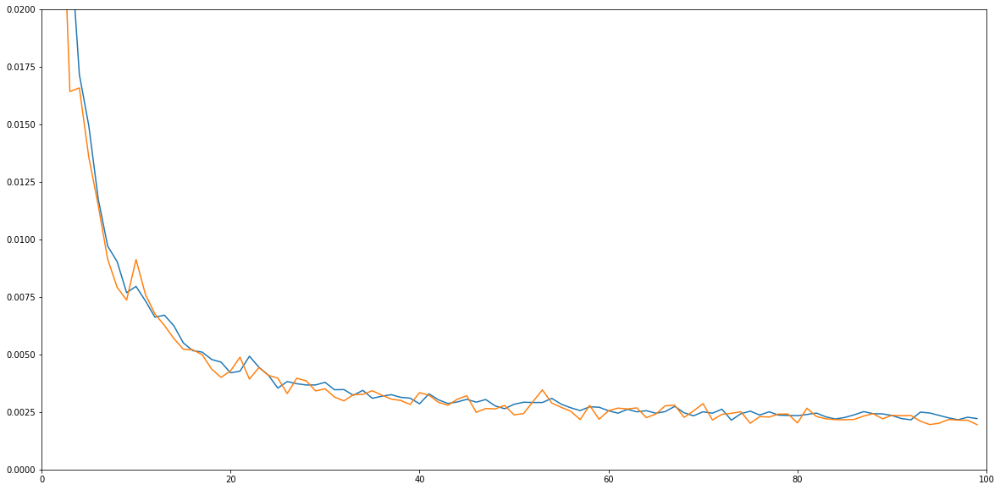

In [87]:
plt.figure(figsize=(20, 10))
plt.plot(history['loss'])
plt.plot(history['valid_loss'])
plt.
plt.axis([0, 100, 0, 0.02])

# Test

In [0]:
test_data = SRDataSet(root_dir='./Set5', sr_factor=SR_FACTOR,
                    transform = (test_before_T, test_after_T))

In [77]:
model.load_state_dict(torch.load('srcnn.pt'))

<All keys matched successfully>

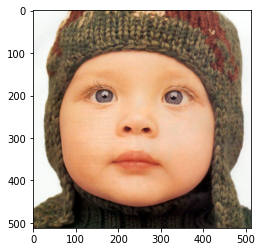

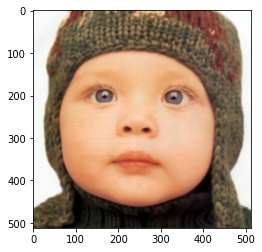

In [78]:
import matplotlib.pyplot as plt
data = test_data[0]
plt.figure()
plt.imshow(data['og'].permute(1, 2, 0))
plt.figure()
plt.imshow(data['lr'].permute(1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 432x288 with 0 Axes>

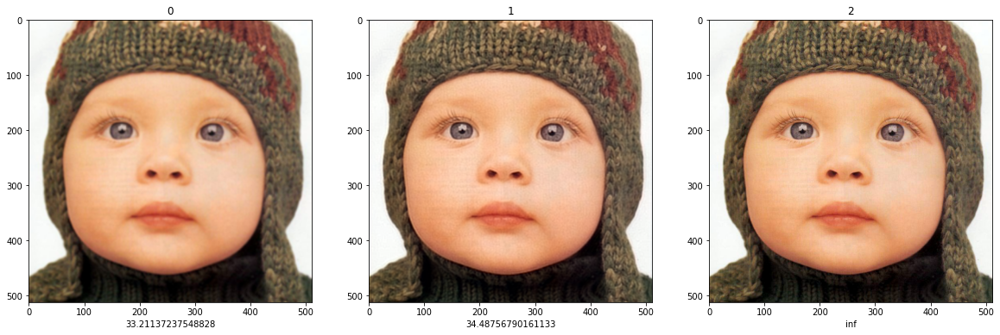

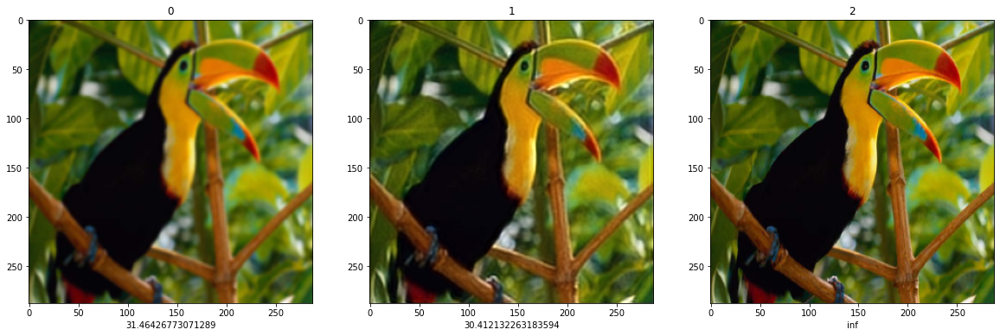

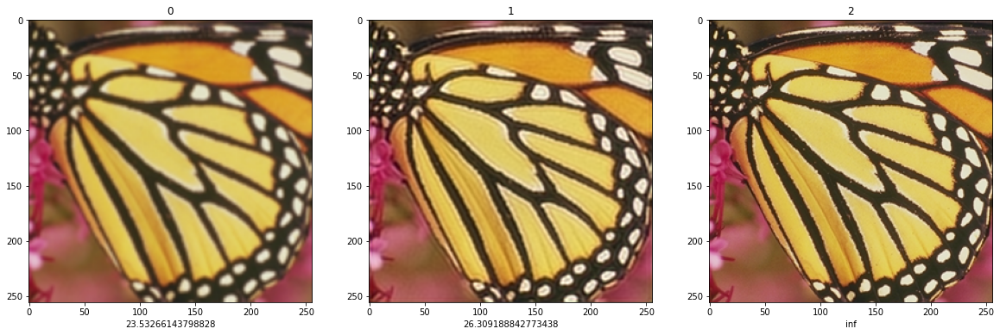

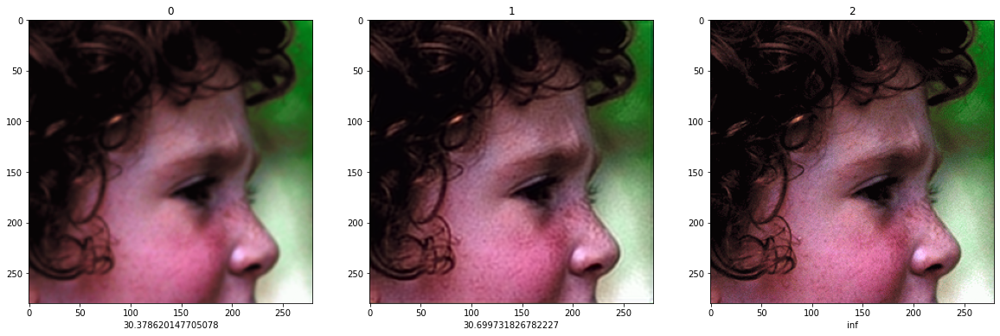

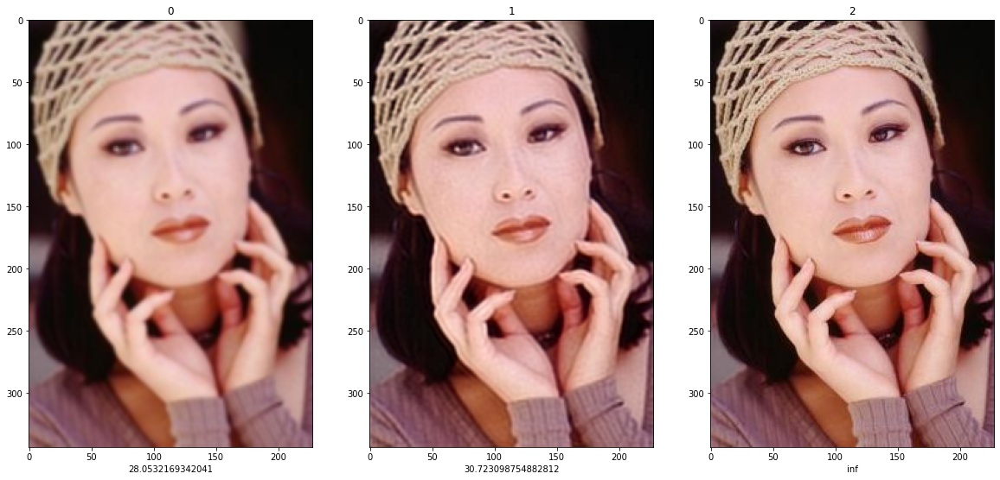

In [105]:
import matplotlib.pyplot as plt

fig = plt.figure()
n_images = len(test_data)

rows = int(np.sqrt(n_images))
cols = int(np.sqrt(n_images))

for i, images in enumerate(test_data):
    og = images['og'].unsqueeze(0).to(device)
    lr = images['lr'].unsqueeze(0).to(device)

    sr = model(lr)
    
    lr, sr, og = lr.squeeze(0), sr.squeeze(0), og.squeeze(0)

    im = [lr, sr, og]
    fig, axes = plt.subplots(1, 3, figsize=(20, 20))
    for i, ax in enumerate(axes):
        ax.set_title(i)
        ax.set_xlabel(psnr(im[i], im[2]).item())
        ax.imshow(im[i].detach().cpu().permute(1, 2, 0))


# RL data

In [0]:
real_before_T = transforms \
                    .Compose([
                              transforms.RandomRotation(10),
                              transforms.RandomCrop(256, padding = 5),
                    ])
real_data = SRDataSet(root_dir='./example', sr_factor=2,
                      transform=(real_before_T, after_transform))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 432x288 with 0 Axes>

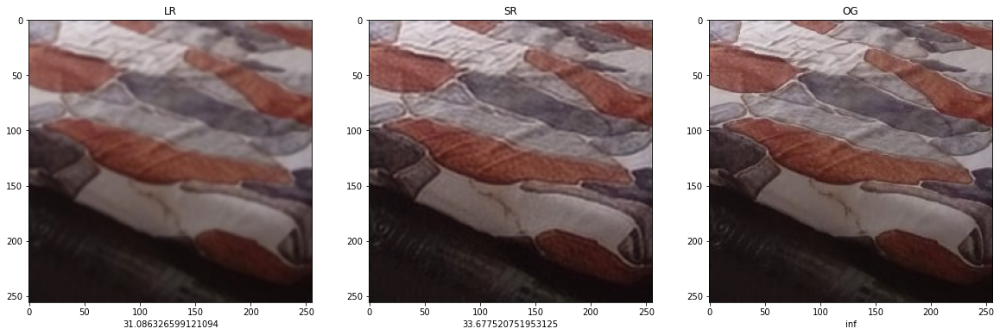

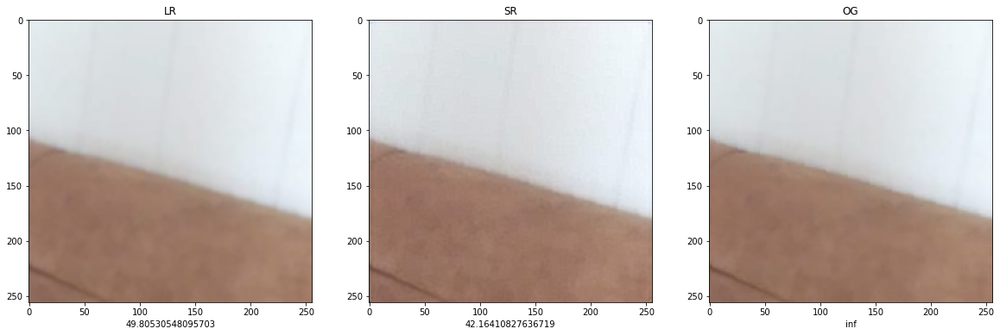

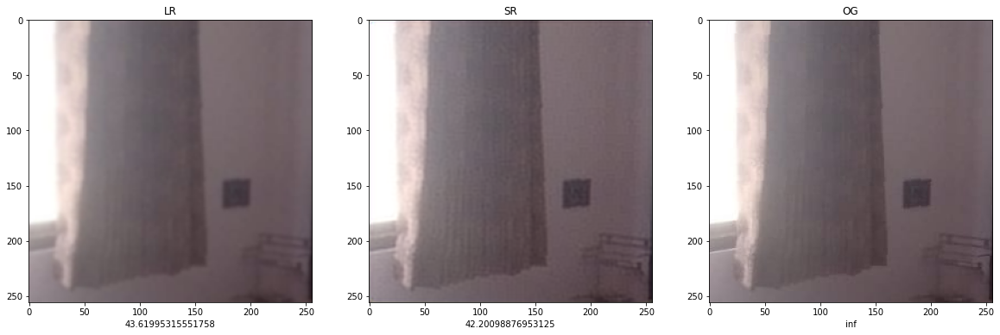

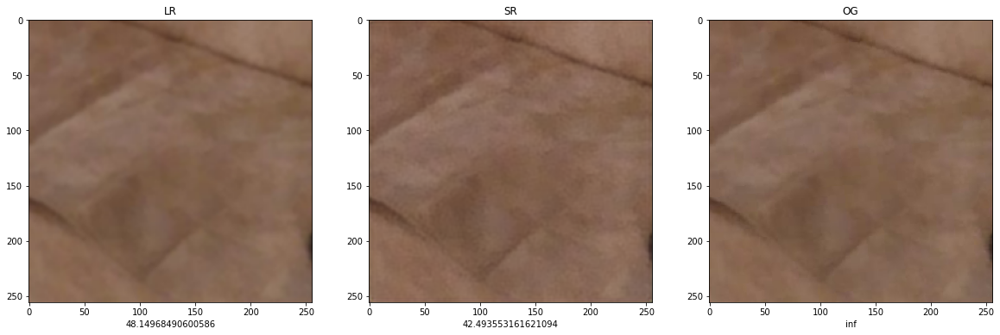

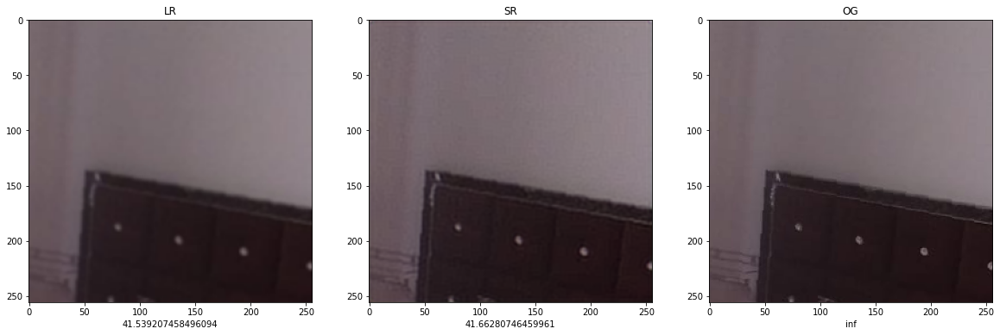

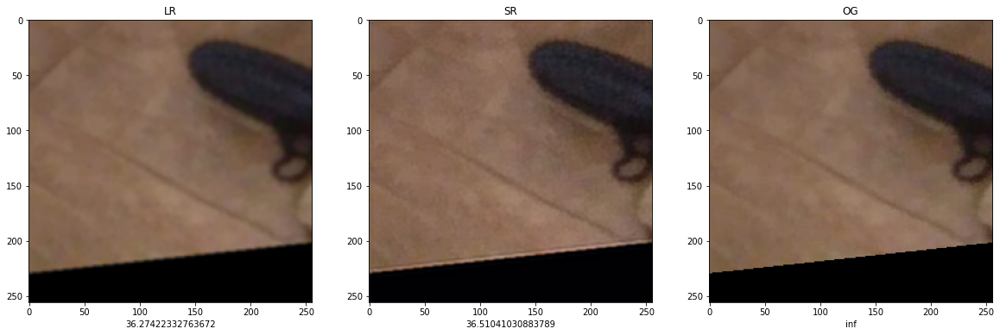

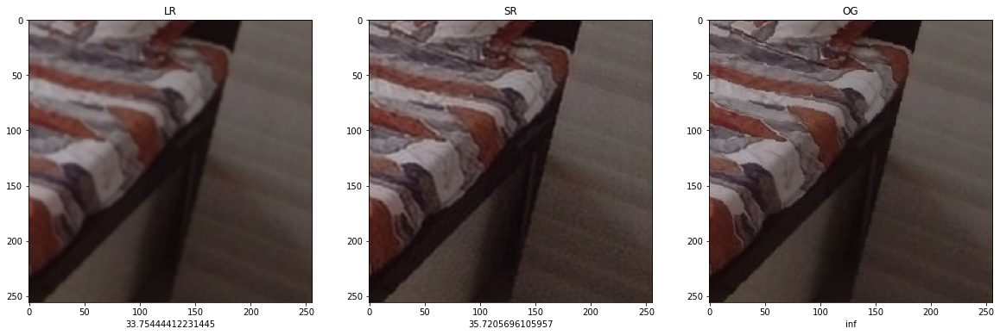

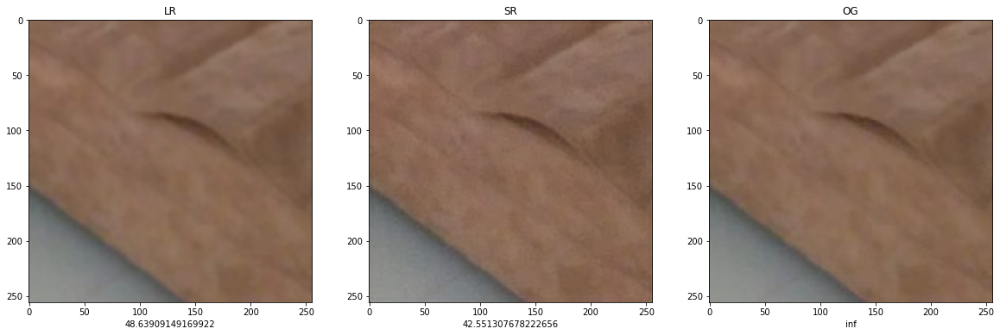

In [107]:
import matplotlib.pyplot as plt

fig = plt.figure()

for _ in range(4):
    for i, images in enumerate(real_data):
        og = images['og'].unsqueeze(0).to(device)
        lr = images['lr'].unsqueeze(0).to(device)
    
        sr = model(lr)
        
        lr, sr, og = lr.squeeze(0), sr.squeeze(0), og.squeeze(0)
    
        im = [lr, sr, og]
        title = ["LR", "SR", "OG"]
        fig, axes = plt.subplots(1, 3, figsize=(20, 20))
        for i, ax in enumerate(axes):
            ax.set_title(title[i])
            ax.set_xlabel(psnr(im[i], im[2]).item())
            ax.imshow(im[i].detach().cpu().permute(1, 2, 0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 432x288 with 0 Axes>

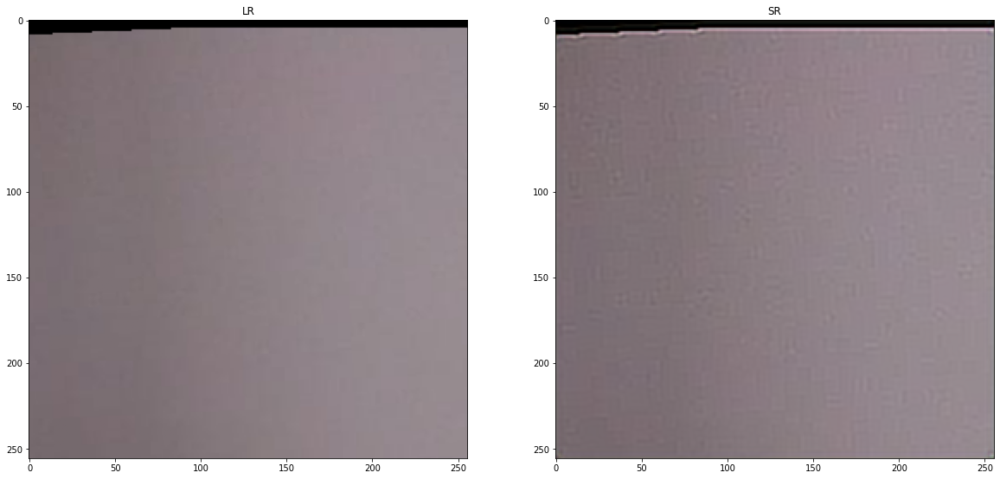

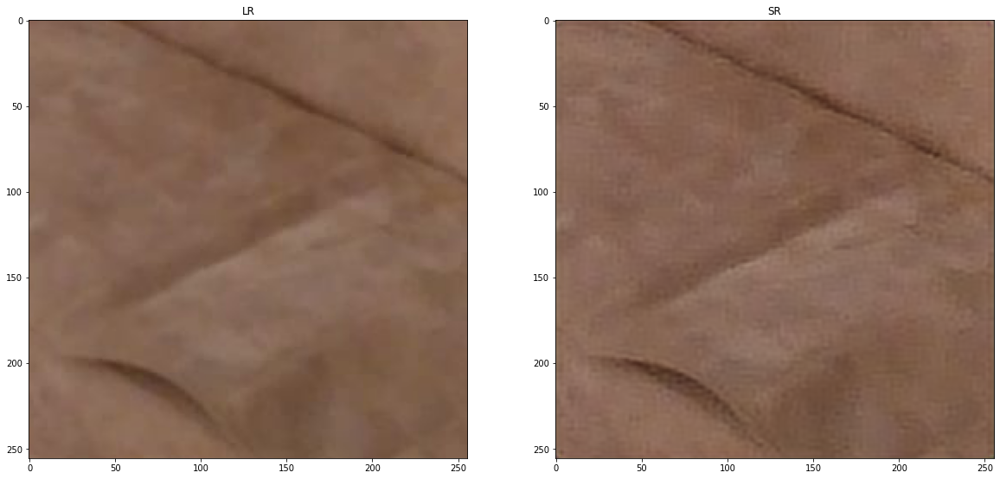

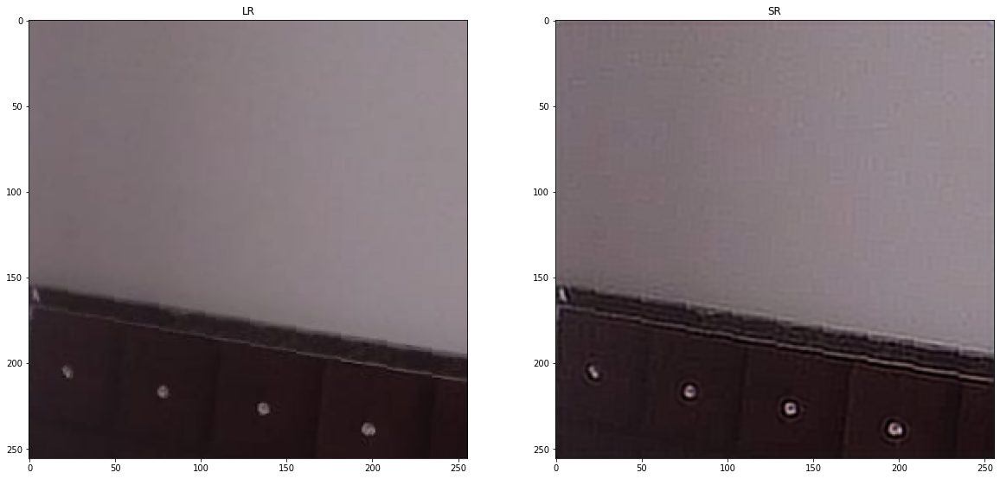

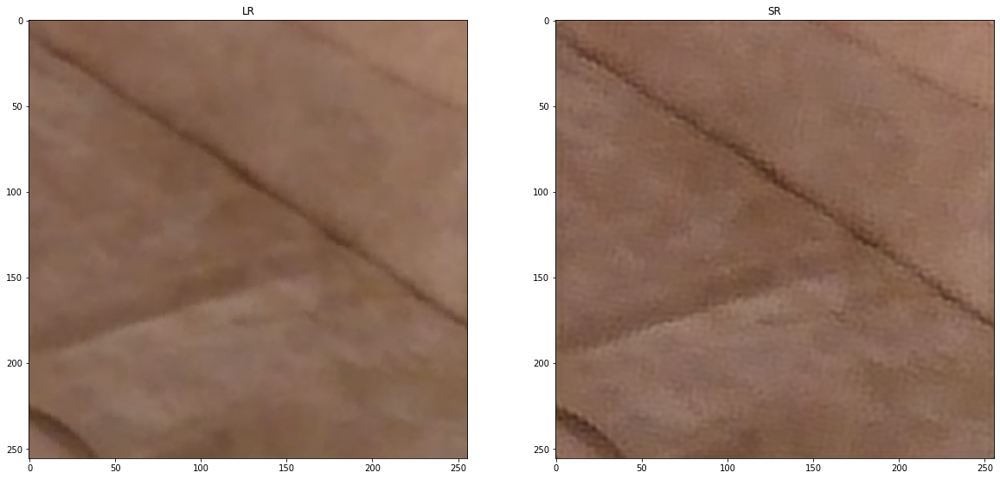

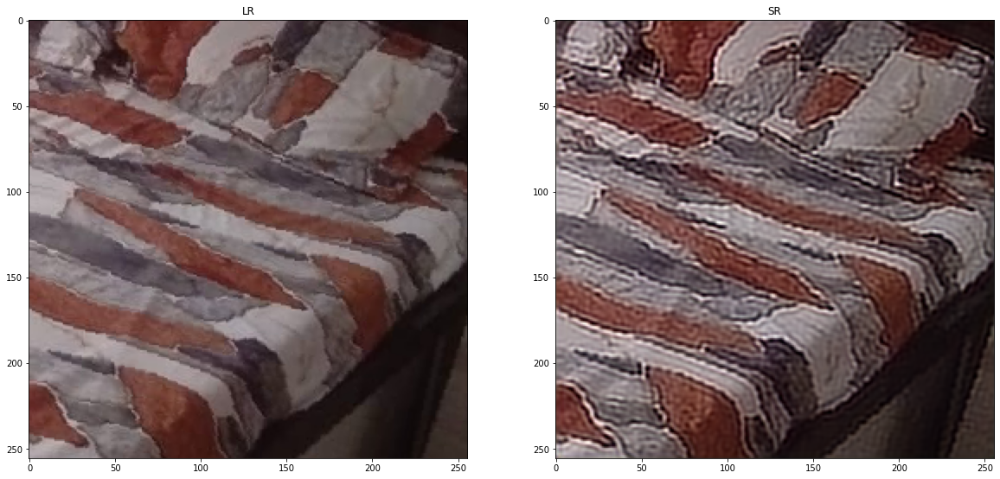

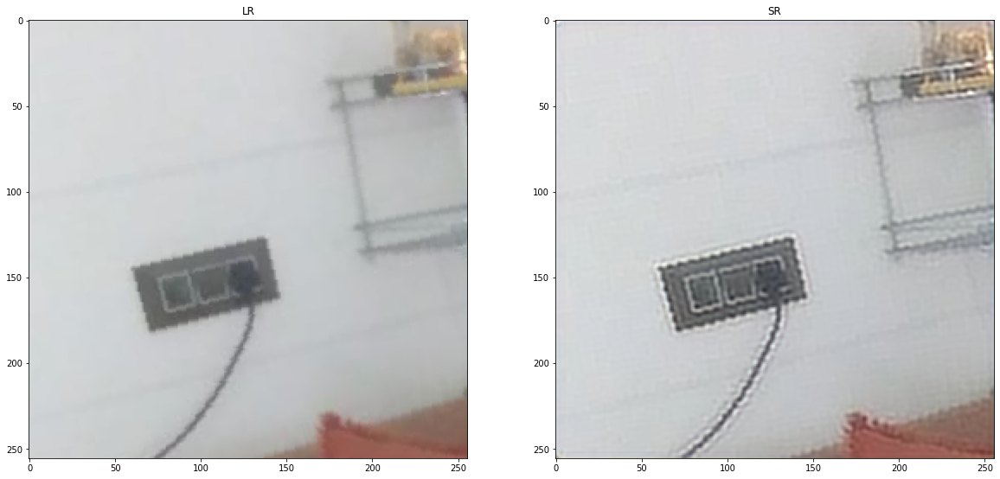

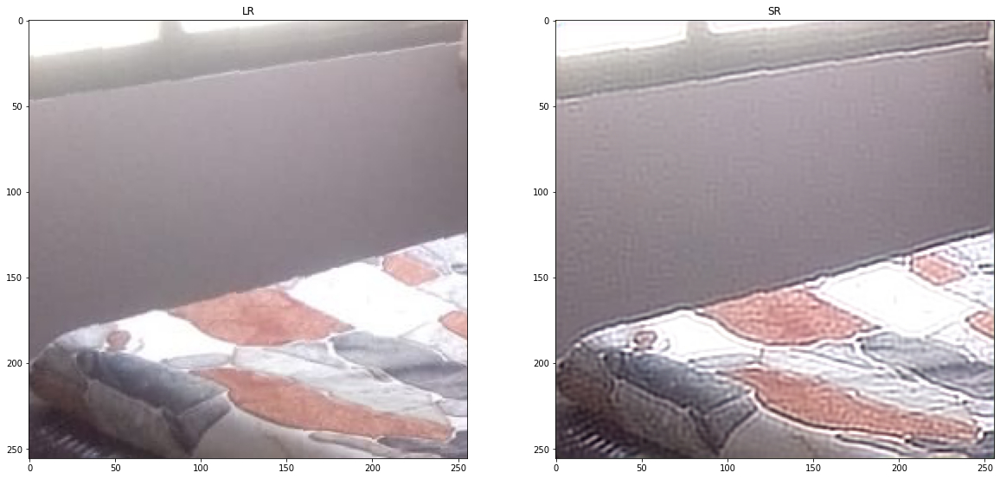

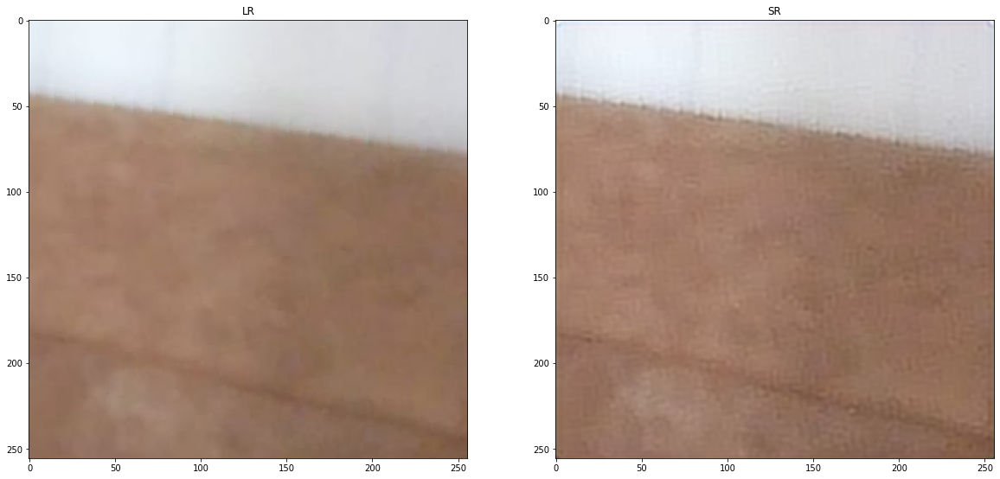

In [101]:
fig = plt.figure()

for _ in range(4):
    for i, images in enumerate(real_data):
        og = images['og'].unsqueeze(0).to(device)
        lr = images['lr'].unsqueeze(0).to(device)
    
        sr = model(og)
        
        lr, sr, og = lr.squeeze(0), sr.squeeze(0), og.squeeze(0)
    
        im = [og, sr]
        title = ["LR", "SR"]
        fig, axes = plt.subplots(1, 2, figsize=(20, 20))
        for i, ax in enumerate(axes):
            ax.set_title(title[i])
            #ax.set_xlabel(psnr(im[i], im[2]).item())
            ax.imshow(im[i].detach().cpu().permute(1, 2, 0))